# IMPORTING LIB

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

import pyroomacoustics as pra

from sklearn.decomposition import FastICA

from scipy.io import wavfile
from scipy.spatial.distance import euclidean
from scipy.spatial import ConvexHull

import mir_eval
import pesq

from utils.ICA_utils import preprocessing, FastIca, plot_signals_sequential, plot_signals, norm_signals, complete_plot, audio_widget

In [3]:
import warnings
# Suppressione specifica delle avvertenze WavFileWarning
warnings.filterwarnings("ignore", category=wavfile.WavFileWarning)

# SOURCE GENERATION

In [4]:
# Set the sampling frequency (assumed to be constant for all files)
fs = 44100

# Desired duration in seconds for all samples
dur_seconds = 5

# Calculate the number of samples required to achieve the desired duration
dur_samples = int(dur_seconds * fs)

# Define the folder path where the audio files are located
folder_path = "audio/"

# Find all the audio files in the folder
files_name = [file for file in os.listdir(folder_path) if file.endswith(".wav")]

# Create an empty numpy array to store the normalized and trimmed audio samples
sources_array = np.empty((len(files_name), dur_samples))

# Iterate over each audio file
for idx, file in enumerate(files_name):
    # Load the file path for the current audio file
    file_path = os.path.join(folder_path, file)
    
    # Read the audio file
    _, audio = wavfile.read(file_path)  # Here, we're not using the sampling frequency returned by wavfile.read as we've assumed it's constant

    if len(audio) > dur_samples:
        cut_audio = audio[:dur_samples]
        
        # Normalize the audio sample
        cut_audio = cut_audio / abs(cut_audio).max()
        sources_array[idx] = cut_audio

    else:
        # Normalize the audio sample
        audio = audio / abs(audio).max()
        sources_array[idx, :len(audio)] = audio

# Ensure all rows have the same length (in case some files were shorter than others)
min_length = min(len(audio) for audio in sources_array)
sources_arrays = sources_array[:, :min_length]


In [5]:
# Iterate over each audio file and its corresponding sample to create an audio-player
audio_widget(sources_array, fs, files_name)

voice2.wav:


voice3.wav:


voice1.wav:


piano2.wav:


piano1.wav:


In [16]:
# Define the indices of the files you want to inspect (assuming files are 0-indexed)
choosen_indx = [0, 1]  # Replace with the indices of files 1 and 4
N = len(choosen_indx)

# create the SOURCE matrix
S = sources_arrays[choosen_indx]

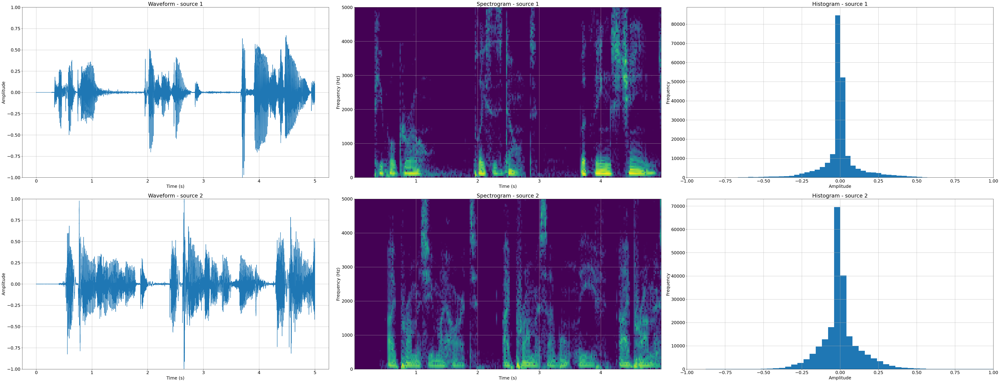

In [17]:
complete_plot(S, 44100, names='source')

# AUDIO RECORDING SIMULATION

## ROOM CREATION

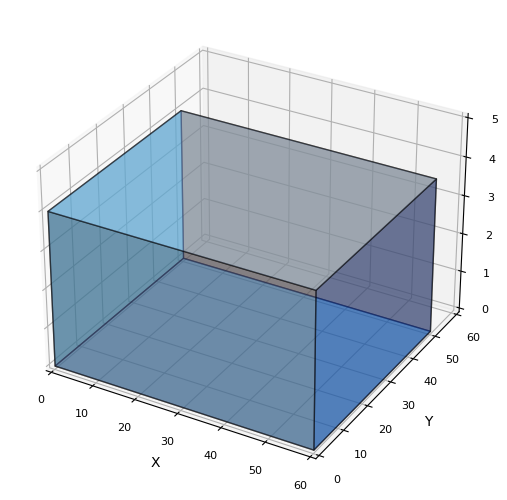

In [57]:
# Define the corners of a 2D room as an array of (x, y) coordinates
corners = np.array([[0,0], [0,50], [60,50], [60,0]]).T  # [x,y]

# Create a 2D room object from the given corners
# max_order: Maximum reflection order for ray tracing
# materials: Defines the acoustic properties of the walls 
# (absorption coefficient, reflection coefficient) - float between (0;1) 
absorption = 0.9  # Absorption coefficient: Determines how much sound energy is absorbed by the walls (0 means no absorption, 1 means complete absorption)
reflection = 0.1  # Reflection coefficient: Determines how much sound energy is reflected by the walls (0 means no reflection, 1 means perfect reflection)
room = pra.Room.from_corners(
    corners,
    max_order=3,
    materials=pra.Material(absorption, reflection),  # Material properties of the walls
    ray_tracing=True,  # Perform ray tracing for sound propagation
    air_absorption=True,  # Consider air absorption
    fs=fs  # Sampling frequency
)

# Set the parameters for ray tracing
# receiver_radius: Radius of the receiver for computing the visibility polygon
# n_rays: Number of rays to use for ray tracing
# energy_thres: Threshold energy for ray termination
room.set_ray_tracing(
    receiver_radius=0.5,  # Radius of the receiver for computing the visibility polygon
    n_rays=10000,  # Number of rays to use for ray tracing
    energy_thres=1e-5  # Threshold energy for ray termination
)

# Extrude the 2D room to create a 3D room with a specified height
# materials: Defines the acoustic properties of the walls in 3D (absorption coefficient, reflection coefficient)
room.extrude(
    4.,  # Height of the 3D room
    materials=pra.Material(absorption, reflection)  # Material properties of the walls in 3D
)

# Plot the 3D room 
fig, ax = room.plot()
ax.set_xlim([0, 60])  # Set x-axis limits
ax.set_ylim([0, 60])  # Set y-axis limits
ax.set_zlim([0, 5])  # Set z-axis limits
ax.set_xlabel('X', fontsize=10)  # Label for x-axis with smaller font size
ax.set_ylabel('Y', fontsize=10)  # Label for y-axis with smaller font size
ax.set_zlabel('Z', fontsize=10)  # Label for z-axis with smaller font size

# Set font size for ticks
ax.tick_params(axis='both', which='major', labelsize=8)  # Set font size for major ticks
ax.tick_params(axis='both', which='minor', labelsize=6)  # Set font size for minor ticks

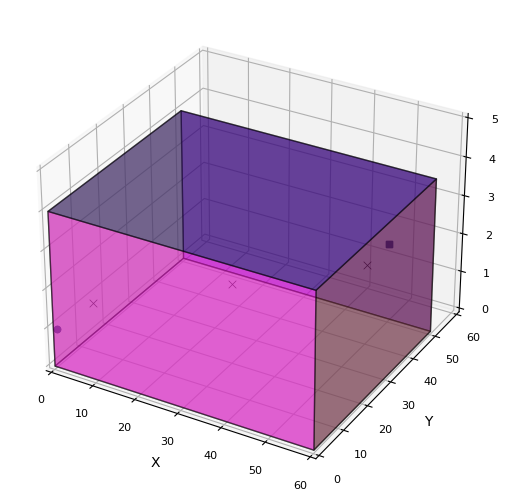

In [58]:
# Define the locations of sources within the room and their corresponding signals
# we must know how many sources there are in S
sources_info = {
    "source1": {"loc": np.array([1., 0., 1.]), "signal": S[0]},  # Location and signal for source 1
    "source2": {"loc": np.array([50., 50., 2.]), "signal": S[1]}  # Location and signal for source 2
}

# Add sources to the room
for name, info in sources_info.items():
    room.add_source(info["loc"], signal=info["signal"])  # Add source with specified location and signal


# Define the positions of two microphones in 3D space [[x1, x2..],[y1, y2..],[z1, z2..]]
mic_positions = np.array([[10., 30., 50.], [0., 20., 40.], [2., 2., 2.]])  # Microphone positions
M = mic_positions.shape[0]; # number of microphon in the room

# Add the microphone array to the room
room.add_microphone_array(pra.MicrophoneArray(mic_positions, fs))  # Add microphone array with specified positions

# Plot the 3D room with:
# sources (solid markers)
# microphones (X markers)
fig, ax = room.plot(mic_marker_size=30)
ax.set_xlim([0, 60])  # Set x-axis limits
ax.set_ylim([0, 60])  # Set y-axis limits
ax.set_zlim([0, 5])  # Set z-axis limits
ax.set_xlabel('X', fontsize=10)  # Label for x-axis with smaller font size
ax.set_ylabel('Y', fontsize=10)  # Label for y-axis with smaller font size
ax.set_zlabel('Z', fontsize=10)  # Label for z-axis with smaller font size

# Set font size for ticks
ax.tick_params(axis='both', which='major', labelsize=8)  # Set font size for major ticks
ax.tick_params(axis='both', which='minor', labelsize=6)  # Set font size for minor ticks


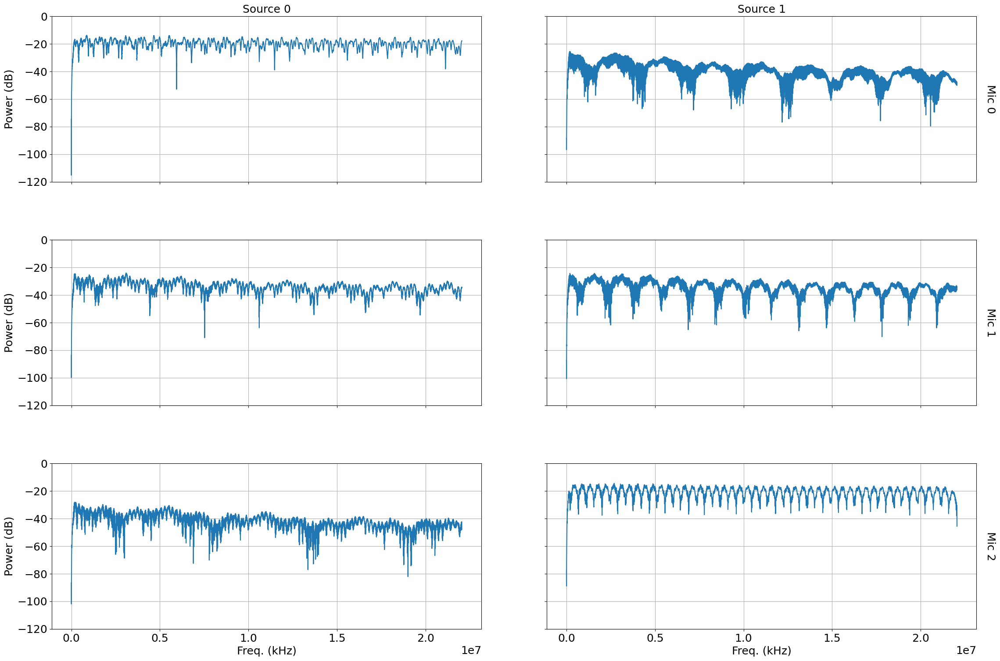

In [103]:
# Plot the room impulse response (RIR)
room.plot_rir(FD=True)

# Get the current figure
fig = plt.gcf()

# Set the size of the figure for better visualization
fig.set_size_inches(30, 20)

# Add grid lines to each subplot and set y-axis limits
for ax in fig.get_axes():
    ax.grid(True)
    ax.set_ylim([-120, 0])  # Adjust the y-axis limits as needed


In [46]:
room.simulate()

# Mixture signals recorded by the micophones 
X = room.mic_array.signals

## INSPECT RECORDINGS

In [47]:
audio_widget(X, fs, name='simulated recording mic')

simulated recording mic 1:


simulated recording mic 2:


simulated recording mic 3:


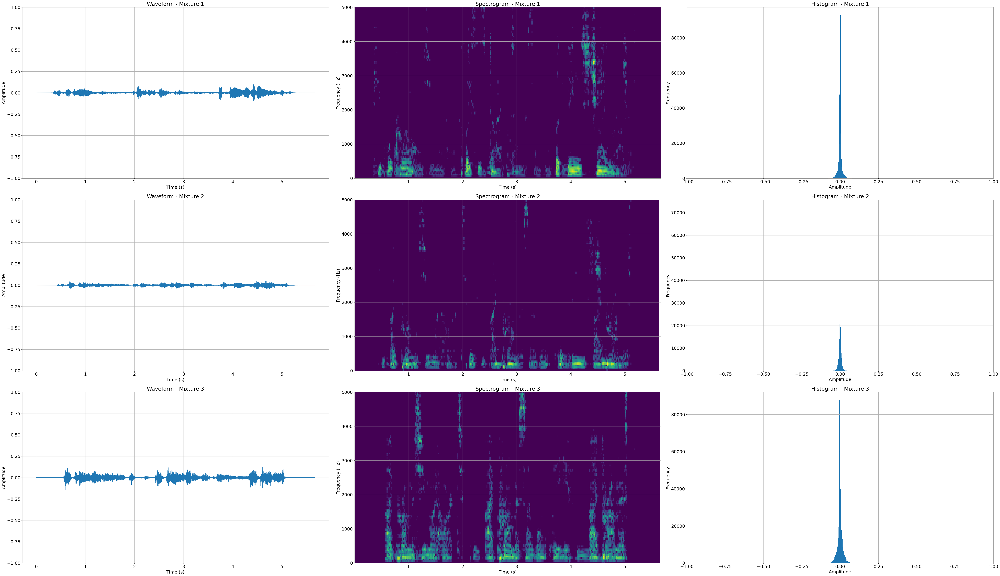

In [60]:
complete_plot(X, 44100, 'Mixture')

# FastICA (sklearn)

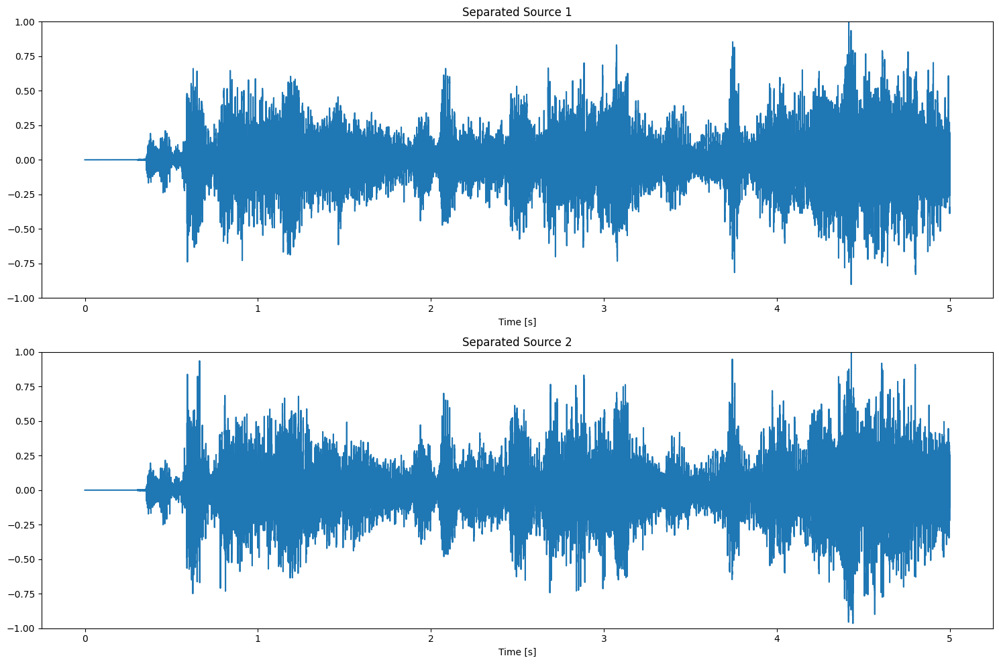

In [13]:
# Apply FastICA to separate the sources
ica = FastICA(n_components=N)
separated_sources_raw = (ica.fit_transform(signal_rec.T)).T

# Calculate the maximum absolute value in each signal
max_values = np.max(np.abs(separated_sources_raw), axis=1, keepdims=True)

# Normalize each signal by dividing by its maximum absolute value and clipping it to the same duration as the original signals
separated_sources = separated_sources_raw[:, :dur_samples] / max_values

# Create subplots
fig, axs = plt.subplots(N, 1, figsize=(15, 10))

# Plot waveforms
for i in range(N):
    axs[i].plot(np.arange(len(separated_sources[i])) / fs, separated_sources[i])
    axs[i].set_ylim(-1,1)
    axs[i].set_xlabel('Time [s]')
    axs[i].set_title(f'Separated Source {i+1}')

plt.tight_layout()
plt.show()

In [14]:
# Get the mixing matrix from the ICA transformation
ica_transformation = ica.mixing_

# Print the shape of the separated sources array and the mixing matrix
print("Shape of separated sources array:", separated_sources.shape)
print("\n ICA Mixing Matrix:")
print(ica_transformation)


Shape of separated sources array: (2, 220500)

 ICA Mixing Matrix:
[[ 1.13944982e-02  1.08568959e-02]
 [ 9.92651406e-05 -6.72865564e-04]
 [ 1.13710063e-02 -1.14019261e-02]]


In [15]:
for i in range(N):
    # Separated sources by FastICA
    print(f'Separated source {i+1}:')
    display(Audio(separated_sources[i, :], rate=fs))

Separated source 1:


Separated source 2:


# FastICA ()

In [65]:
# Reconstructing the signals through fastICA 
S_recovered_raw, W = FastIca(X, 2)

Dimensionality reduction performed


In [70]:
# EXPLAIN why norm and why trim
S_recovered = norm_signals(S_recovered_raw)[:,:min_length]


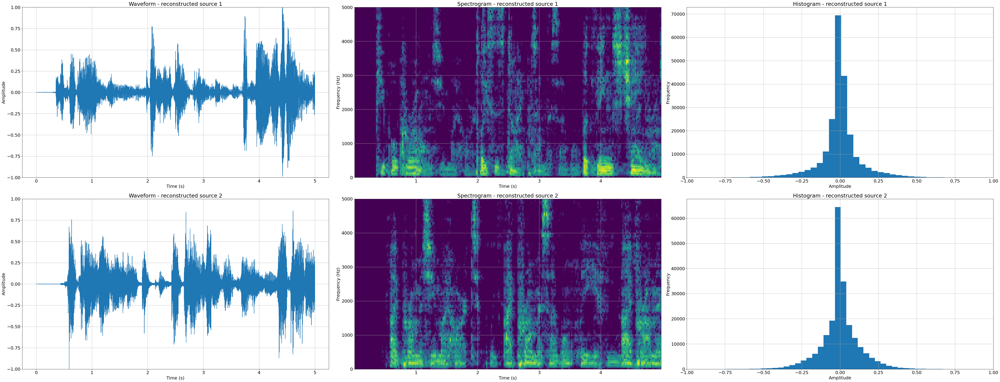

In [71]:
complete_plot(S_recovered, fs, names='reconstructed source')

In [72]:
audio_widget(S_recovered, fs, name='reconstructed source')

reconstructed source 1:


reconstructed source 2:


# PERFORMANCE ANALYSIS

## BSS Metrics

The measure of performance is based on the principle that a given estimated source can be decomposed as:

$$
\hat{s}(t) = s(t) + e_{\text{interf}}(t) + e_{\text{noise}}(t) + e_{\text{artif}}(t)
$$

where:
- $ s(t) $ is the original source
- $ e_{\text{interf}}(t) $ is the noise due to interference with other sources
- $ e_{\text{noise}}(t) $ is a perturbation term due to noise (typically Gaussian)
- $ e_{\text{artif}}(t) $ is the noise due to artifacts created by the separation process.

The noise introduced by each of these terms is estimated as follows:

- SDR (Source-to-Distortion Ratio) measures the ratio of the energy of the true sources to the energy of the distortion caused by the separation process.

  $$
  \text{SDR} = 10 \log_{10} \frac{{\sum s(t)^2}}{{\sum (s(t) - \hat{s(t)})^2}}
  $$

- SIR (Source-to-Interference Ratio) measures the ratio of the energy of the true sources to the energy of the interference caused by other sources.

  $$
  \text{SIR} = 10 \log_{10} \frac{{\sum s(t)^2}}{{\sum e_{\text{interf}}(t)^2}}
  $$

- SAR (Source-to-Artifact Ratio) measures the ratio of the energy of the true sources to the energy of any artifacts introduced by the separation process.

  $$
  \text{SAR} = 10 \log_{10} \frac{{\sum s(t)^2}}{{\sum e_{\text{artif}}(t)^2}}
  $$

All the indices mentioned above are expressed in $\text{dB} $. 

These metrics are commonly used to evaluate the performance of Blind Source Separation (BSS) algorithms
These metrics provide insights into how well the source separation algorithm is performing in terms of preserving the original sources while minimizing interference and artifacts.

http://bass-db.gforge.inria.fr/bss_eval/

In [73]:
# Calculating BSS Evaluation Metrics

# Using mir_eval library to calculate SDR, SIR, SAR metrics
sdr, sir, sar, perm = mir_eval.separation.bss_eval_sources(S, S_recovered, compute_permutation=True)

# Printing the metrics
print("SDR:", sdr)  # Print the Source-to-Distortion Ratio (SDR) metric
print("SIR:", sir)  # Print the Source-to-Interference Ratio (SIR) metric
print("SAR:", sar)  # Print the Source-to-Artifact Ratio (SAR) metric

print(perm) 

SDR: [ -8.21007217 -14.816023  ]
SIR: [18.00610813 10.37802233]
SAR: [ -8.13148443 -14.4219806 ]
[0 1]


## Sorting and matching signals

In [74]:
# Permuting the separated sources based on the permutation variable
# This step is crucial because the order of the separated_sources may not match the order of the original sources after fastICA 
# align them with the original sources to facilitating  comparison and evaluation

# Initialize an array to store the permuted separated sources
S_recovered_perm = np.empty_like(S_recovered)

# Permute the separated sources based on the permutation variable
for i, p in enumerate(perm):
    S_recovered_perm[i] = S_recovered[p]

# Now separated_sources_permuted contains the separated sources in the same order as the original sources

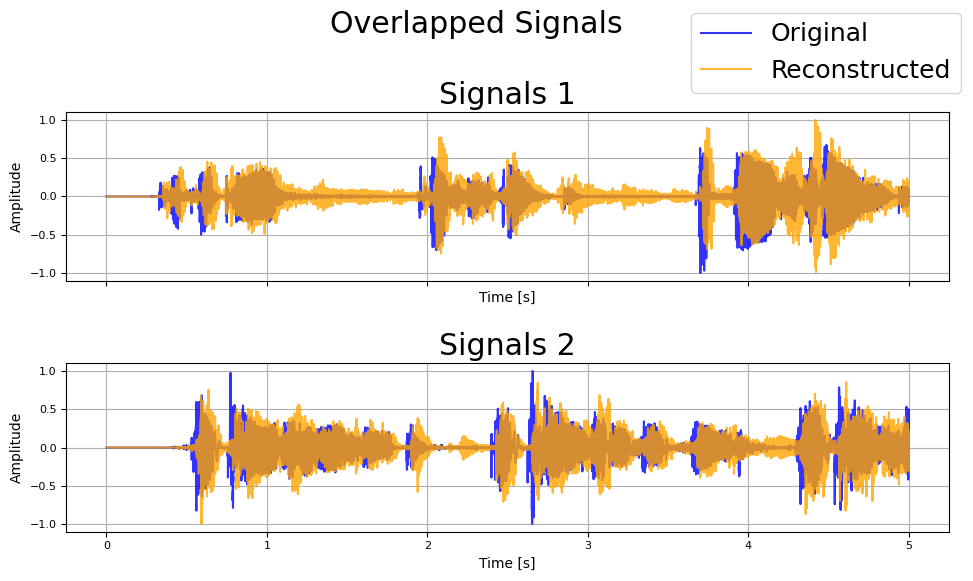

In [95]:
# Calculate time axis in seconds
time_sec = np.arange(len(S[0])) / fs

# Create subplots for each pair of signals
fig, axs = plt.subplots(nrows=len(S), ncols=1, figsize=(10, 6), sharex=True, sharey=True)

# Plot original and reconstructed signals in each subplot
for i, (original, reconstructed) in enumerate(zip(S, S_recovered_perm)):
    axs[i].plot(time_sec, original, label="Original", color='blue', alpha=0.8)  # Plot original signal
    axs[i].plot(time_sec, reconstructed, label="Reconstructed", color='orange', alpha=0.8)  # Plot reconstructed signal
    axs[i].set_title(f"Signals {i + 1}")  # Set title for the subplot
    axs[i].grid(True)  # Add grid to the subplot
    axs[i].tick_params(axis='both', which='major', labelsize=8)  # Lower font size of major ticks
    axs[i].tick_params(axis='both', which='minor', labelsize=4)  # Lower font size of minor ticks
    axs[i].set_xlabel('Time [s]', fontsize=10)  # Lower font size of x-axis label
    axs[i].set_ylabel('Amplitude', fontsize=10)  # Lower font size of y-axis label

# Create a single legend for all subplots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

plt.suptitle('Overlapped Signals')  # Overall title for the plot
plt.tight_layout()  # Adjust layout to prevent overlapping of subplots
plt.show()  # Display the plot


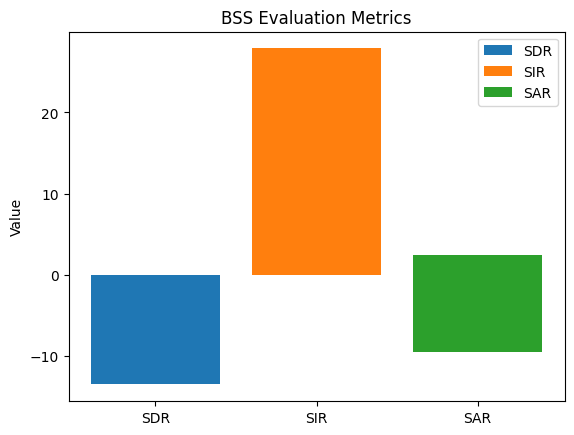

In [24]:
# Plotting the Evaluation Metrics

# List of evaluation metrics
metrics = ['SDR', 'SIR', 'SAR']

# Individual values of SDR, SIR, SAR metrics
values = [[-13.55, -1.43], [2.42, 27.89], [-9.49, 2.44]]

# Creating a bar plot for each metric
for metric, metric_values in zip(metrics, values):
    plt.bar(metric, metric_values, label=metric)

# Adding labels and title to the plot
plt.ylabel('Value')  # Label for the y-axis indicating individual metric values
plt.title('BSS Evaluation Metrics')  # Title of the plot
plt.legend()  # Display legend for metric labels

# Displaying the plot
plt.show()


## PESQ Metrics

In [25]:
# Calculate PEAQ-like score for each channel separately
peaq_scores = []
for i, (ref_channel, sep_channel_permuted) in enumerate(zip(sources, separated_sources_permuted)):
    peaq_score = pesq.pesq(ref_channel, sep_channel_permuted, fs)
    peaq_scores.append(peaq_score)
    
    # Print PEAQ-like score for each channel
    print(f"PEAQ-like Score for channel {i+1}: {peaq_score}")

# Compute the average PEAQ-like score across channels
average_peaq_score = np.mean(peaq_scores)

# Print average PEAQ-like score
print("Average PEAQ-like Score:", average_peaq_score)


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()